In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

from devito import Function, Eq, Operator, Grid, SubDomain, TimeFunction, VectorTimeFunction, grad, div, NODE
from examples.seismic import TimeAxis, RickerSource

In [2]:
# with the creation of Grid two subdomains have been generated by default, 'domain' and 'interior'.
shape = (10, 10, 10)
grid = Grid(shape=shape, extent=shape)
grid.subdomains

{'domain': SubDomain domain[(x, y, z)],
 'interior': SubDomain interior[(i0x, i0y, i0z)]}

In [3]:
# by default 'domain' is in fact the entire computational domain
grid.subdomains['domain'].shape

(10, 10, 10)

In [4]:
# the interoior subdomain excludes the 'outermost' grid point in each dimension
grid.subdomains['interior'].shape

(8, 8, 8)

In [5]:
# example for how to define a subdomain that spans an entire 3D computational grid
# (this is similar to how 'domain' is defined internally)
class FullDomain(SubDomain):
    name = 'mydomain'
    def define(self, dimensions):
        x, y, z = dimensions
        return {x: x, y: y, z: z}
    
# defined a class FullDomain based on SubDomain with the method define overridden
# takes as input a set of Dimensions and produces a mapper from which we can create a subdomain

full_domain = FullDomain()
my_grid = Grid(shape = (10, 10, 10), subdomains = (full_domain, ))
my_grid.subdomains

{'domain': SubDomain domain[(x, y, z)],
 'interior': SubDomain interior[(i0x, i0y, i0z)],
 'mydomain': SubDomain mydomain[(x, y, z)]}

In [6]:
# example for how to define a subdomain that spans an entire 3D computational grid
# (similar to 'interior')
class InnerDomain(SubDomain):
    name = 'inner'
    def define(self, dimensions):
        # d will be a tuple of N-dimensions and then {d: ... for d in dimensions} 
        # such that our mapper will be valid for N-dimensional grids.
        d = dimensions

        return {d: ('middle', 1, 1) for d in dimensions}

# For mappers of the form ('middle', N, M), the SubDomain spans a contiguous region 
# of dimension_size - (N + M) points starting at (in terms of python indexing) N 
# and finishing at dimension_size - M - 1.
        
# For mappers of the form d: ('left', N) the SubDomain spans a contiguous region
# of N points starting at d's left extreme

# For mappers of the form ('right', N) is analogous to the previous case but starting 
# at the dimensions right extreme instead.

inner_domain = InnerDomain()
my_grid = Grid(shape = (10, 10, 10), subdomains = (full_domain, inner_domain))
my_grid.subdomains

{'domain': SubDomain domain[(x, y, z)],
 'interior': SubDomain interior[(i0x, i0y, i0z)],
 'mydomain': SubDomain mydomain[(x, y, z)],
 'inner': SubDomain inner[(i2x, i2y, i2z)]}

In [7]:
my_grid.subdomains['inner'].shape

(8, 8, 8)

In [8]:
# Example subdomain of the computational grid excluding 3 nodes on the left and 4 on the
# right in the x dimension, and 4 nodes on the left and 3 on the right in the y dimension

# NOTE that in the data array the x dimension is going down rows, and y dimension is going along columns
# (i.e. like matrix indexing, opposite to traditional cartesian coordinates)

class Middle(SubDomain):
    name = 'middle'
    def define(self, dimensions):
        x, y = dimensions
        return {x: ('middle', 3, 4), y: ('middle', 4, 3)}

mid = Middle()

In [9]:
grid = Grid(shape = (10, 11), subdomains = (mid, ))
f = Function(name = 'f', grid = grid)

# pass the middle subdomain to the equation, thus telling Devito to only
# evaluate that particular equation within the subdomain 'middle'
eq = Eq(f, f+1, subdomain = grid.subdomains['middle'])
op = Operator(eq)()

# When we view the raw data array, need to transpose it so that the dimensions match
# traditional cartesian coordinates system (with origin in top left corner)
f.data.T

Operator `Kernel` ran in 0.01 s


Data([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
      [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
      [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
      [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
      [0., 0., 0., 1., 1., 1., 0., 0., 0., 0.],
      [0., 0., 0., 1., 1., 1., 0., 0., 0., 0.],
      [0., 0., 0., 1., 1., 1., 0., 0., 0., 0.],
      [0., 0., 0., 1., 1., 1., 0., 0., 0., 0.],
      [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
      [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
      [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]], dtype=float32)

In [10]:
# 'left' consists of two nodes on the left hand side in the x dimension and the entire y dimension
class Left(SubDomain):
    name = 'left'
    def define(self, dimensions):
        x, y = dimensions
        return {x: ('left', 2), y: y}

ld = Left()

In [11]:
# 'right' consists of the entire x dimension and the two 'right-most' nodes in the y dimension
class Right(SubDomain):
    name = 'right'
    def define(self, dimensions):
        x, y = dimensions
        return {x: x, y: ('right', 2)}

rd = Right()

In [12]:
grid = Grid(shape = (10, 10), subdomains = (mid, ld, rd))
f = Function(name = 'f', grid = grid)

eq1 = Eq(f, f+1, subdomain = grid.subdomains['middle'])
eq2 = Eq(f, f+2, subdomain = grid.subdomains['left'])
eq3 = Eq(f, f+3, subdomain = grid.subdomains['right'])

In [13]:
op2 = Operator([eq1, eq2, eq3])()

Operator `Kernel` ran in 0.01 s


In [14]:
# there are four grid points on which the 'left' and 'right' subdomains overlap
f.data.T

Data([[2., 2., 0., 0., 0., 0., 0., 0., 0., 0.],
      [2., 2., 0., 0., 0., 0., 0., 0., 0., 0.],
      [2., 2., 0., 0., 0., 0., 0., 0., 0., 0.],
      [2., 2., 0., 0., 0., 0., 0., 0., 0., 0.],
      [2., 2., 0., 1., 1., 1., 0., 0., 0., 0.],
      [2., 2., 0., 1., 1., 1., 0., 0., 0., 0.],
      [2., 2., 0., 1., 1., 1., 0., 0., 0., 0.],
      [2., 2., 0., 0., 0., 0., 0., 0., 0., 0.],
      [5., 5., 3., 3., 3., 3., 3., 3., 3., 3.],
      [5., 5., 3., 3., 3., 3., 3., 3., 3., 3.]], dtype=float32)

# Example

Implementation of both free surface boundary conditions and perfectly-matched layers (PMLs) in the context of the 2nd-order acoustic wave equation. This tutorial is based on the PML implementation outlined in Liu et al's proceeding (https://doi.org/10.1190/1.3627807).

Set up a domain with PMLs along the left, right, and bottom edges, and free surface boundaries at the top.

Note that whilst in practice we would want the PML tapers to overlap in the corners, this requires additional subdomains. As such, they are omitted for simplicity.

In [15]:
shape = (101, 101)
extent = (2000., 2000.)
nbpml = 10  # Number of PMLs on each side
velocity = 4.  # km/s

In [16]:
# Use subdomains to accommodate the modified equations in the PML regions.
# Grid objects cannot have subdomains added retroactively, we must define our subdomains beforehand:

class MainDomain(SubDomain):  # Main section with no damping
    name = 'main'
    def __init__(self, PMLS):
        super().__init__()
        self.PMLS = PMLS
            

    def define(self, dimensions):
        x, y = dimensions
        return {x: ('middle', self.PMLS, self.PMLS), y: ('middle', 0, self.PMLS)}


class Left(SubDomain):  # Left PML region
    name = 'left'
    def __init__(self, PMLS):
        super().__init__()
        self.PMLS = PMLS

    def define(self, dimensions):
        x, y = dimensions
        return {x: ('left', self.PMLS), y: y}


class Right(SubDomain):  # Right PML region
    name = 'right'
    def __init__(self, PMLS):
        super().__init__()
        self.PMLS = PMLS

    def define(self, dimensions):
        x, y = dimensions
        return {x: ('right', self.PMLS), y: y}
    
    
class Base(SubDomain):  # Base PML region
    name = 'base'
    def __init__(self, PMLS):
        super().__init__()
        self.PMLS = PMLS

    def define(self, dimensions):
        x, y = dimensions
        return {x: ('middle', self.PMLS, self.PMLS), y: ('right', self.PMLS)}


main_domain = MainDomain(nbpml)
left = Left(nbpml)
right = Right(nbpml)
base = Base(nbpml)

In [17]:
grid = Grid(shape=shape, extent=extent,
            subdomains=(main_domain, left, right, base))
x, y = grid.dimensions

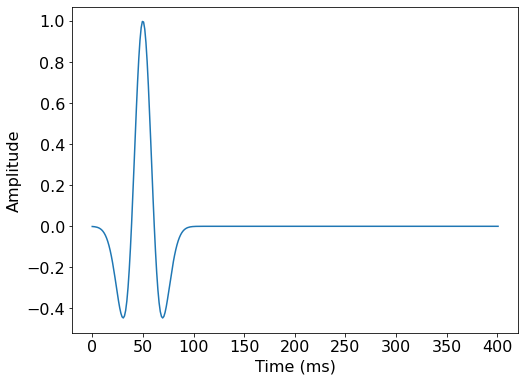

In [18]:
t0 = 0.  # Simulation starts at t=0
tn = 400.  # Simulation length in ms
dt = 1e2*(1. / np.sqrt(2.)) / 60.  # Time step

time_range = TimeAxis(start=t0, stop=tn, step=dt)

f0 = 0.02
src = RickerSource(name='src', grid=grid, f0=f0,
                   npoint=1, time_range=time_range)

# Position source centrally in all dimensions
src.coordinates.data[0, :] = 1000.

src.show()

In [19]:
# staggered used for specifying where derivatives should be evaluated relative to the grid
# staggered=NODE specifies that its derivatives should be evaluated at the node
# staggered=x or staggered=y staggers the grid by half a spacing in those respective dimensions
# a tuple of dimensions can be passed to stagger in multiple dimensions (e.g. staggered=(x, y))
u = TimeFunction(name='u', grid=grid, time_order=2,
                 space_order=6, staggered=NODE, save=time_range.num)

# need to set up a vector auxilliary field in our boundary regions
# VectorTimeFunction is a 'vector' of TimeFunctions, one for each grid dimension
# VectorTimeFunction objects have their associated grids staggered by default
A = VectorTimeFunction(name='A', grid=grid, time_order=2,
                       space_order=6)

In [20]:
# PMLs need a damping parameterisation. In this case, use a quadratic taper over the
# absorbing regions on the sides of the domain.
d_l = (1-0.1*x)**2                    # Left side
d_r = (1-0.1*(grid.shape[0]-1-x))**2  # Right side
d_b = (1-0.1*(grid.shape[1]-1-y))**2  # Base edge

In [21]:
# main domain equation
eq_u = Eq(u.forward, 2*u - u.backward + dt**2*velocity**2*u.laplace,
           subdomain=grid.subdomains['main'])

# Update our auxilliary field in the main body of the domain
eq_A = Eq(A.forward, A + grad(u),
          subdomain=grid.subdomains['main'])

# add the equations for our damped region
# Left side
eq_u_l = Eq(u.forward, u - d_l*dt*u + dt*velocity**2*div(A.forward),
            subdomain=grid.subdomains['left'])

eq_A_l = Eq(A.forward, A - d_l*dt*A + grad(u),
            subdomain=grid.subdomains['left'])

# Right side
eq_u_r = Eq(u.forward, u - d_r*dt*u + dt*velocity**2*div(A.forward),
            subdomain=grid.subdomains['right'])

eq_A_r = Eq(A.forward, A - d_r*dt*A + grad(u),
            subdomain=grid.subdomains['right'])

# Base edge
eq_u_b = Eq(u.forward, u - d_b*dt*u + dt*velocity**2*div(A.forward),
            subdomain=grid.subdomains['base'])

eq_A_b = Eq(A.forward, A - d_b*dt*A + grad(u),
            subdomain=grid.subdomains['base'])

In [22]:
# free surface boundary conditions
time = grid.stepping_dim
bc_u = [Eq(u[time+1, x, 3], 0.)]  # Set pressure field to zero at boundary

In [23]:
# source terms
src_term = src.inject(field=u.forward, expr=src*dt**2*velocity**2)

In [24]:
# Construct operator and run
# It is important to remember that the ordering of equations when an Operator is created 
# dictates the order of loops within the generated c code. Incorrect ordering can lead to 
# updates occuring in the wrong order.
op = Operator([eq_A, eq_A_l, eq_A_r, eq_A_b,
               eq_u, eq_u_l, eq_u_r, eq_u_b]
              + src_term + bc_u)

# op(time=time_range.num-1)
op.apply(time_m=1, time_M=time_range.num-2, dt=dt)
u.data[:, :, :3] = 0 #  Mute out mirrored wavefield above free surface

Operator `Kernel` ran in 0.05 s


In [25]:
# create an animation
from matplotlib import animation
from IPython.display import HTML

# First set up the figure, the axis, and the plot element we want to animate
fig = plt.figure()

# first frame
scale = np.max(u.data[-1])
im = plt.imshow(u.data[0].T,
                origin="upper",
                vmin=-scale, vmax=scale,
                extent=[0, grid.extent[0], grid.extent[1], 0]);
plt.colorbar()
plt.xlabel("x (m)")
plt.ylabel("y (m)")
plt.close();


def init_func():
    pass


def animate_func(i):
    im.set_array(u.data[i].T)
    return im,


fps = 60
anim = animation.FuncAnimation(fig, animate_func, frames=time_range.num, interval=1000/fps)

HTML(anim.to_jshtml())